In [1]:
import pyaudio
import os
import scipy 
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import butter, lfilter, freqz
import IPython
import pyroomacoustics as pra

In [2]:
# PATH = "audio/test-stereo-s21-.wav"
PATH = "audio/test-stereo-v2.wav"
# recorder at 48kHz

In [3]:
def display_left_right(audio_data):
    plt.figure(figsize=(15, 5))
    
    plt.subplot(2, 1, 1)
    plt.plot(audio_data[:,0], label='left')
    plt.plot(audio_data[:,1], label='right')

    plt.subplot(2, 1, 2)
    plt.plot(audio_data[:,0] - audio_data[:,1], label='diff')
    plt.legend()
    plt.show()

In [4]:
rate, data = scipy.io.wavfile.read(PATH)

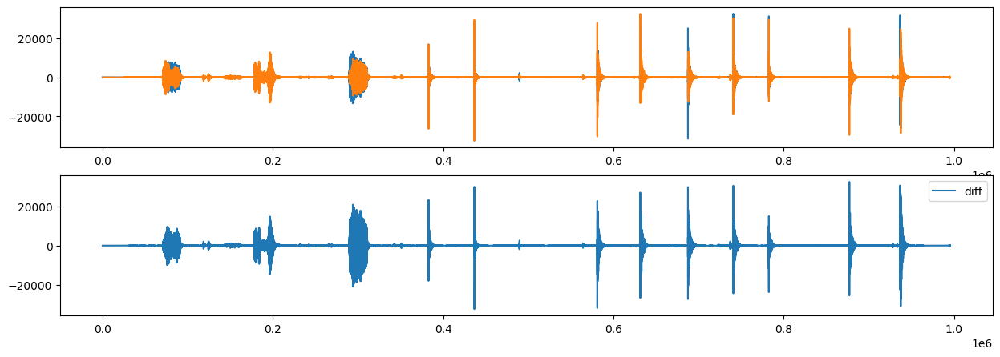

In [5]:
display_left_right(data)

In [6]:
IPython.display.Audio(PATH)

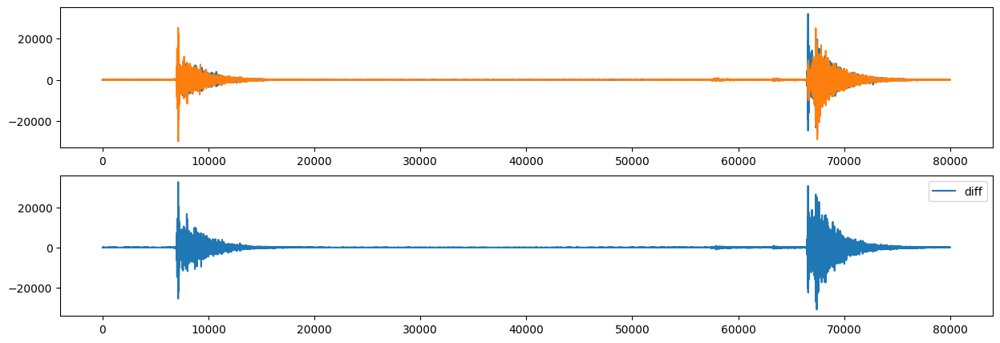

In [7]:
lr_clap_start = 870000
lr_clap_end = 950000
lr_clap = data[lr_clap_start:lr_clap_end]
display_left_right(lr_clap)

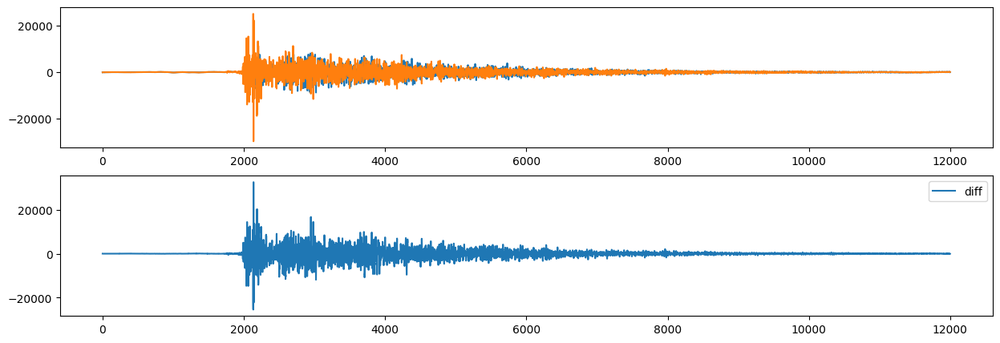

In [8]:
lr_clap_right = lr_clap[5000:17000]
display_left_right(lr_clap_right)

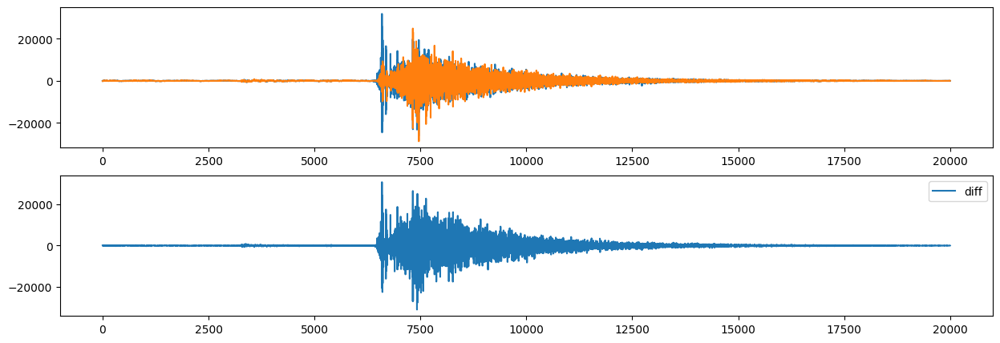

In [9]:
lr_clap_left = lr_clap[60000:80000]
display_left_right(lr_clap_left)

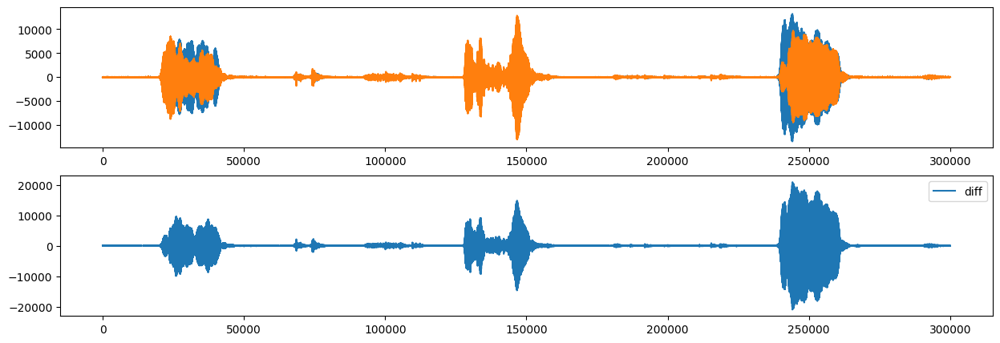

In [10]:
whistle_start = 50000
whistle_end = 350000
whistle = data[whistle_start:whistle_end]
display_left_right(whistle)

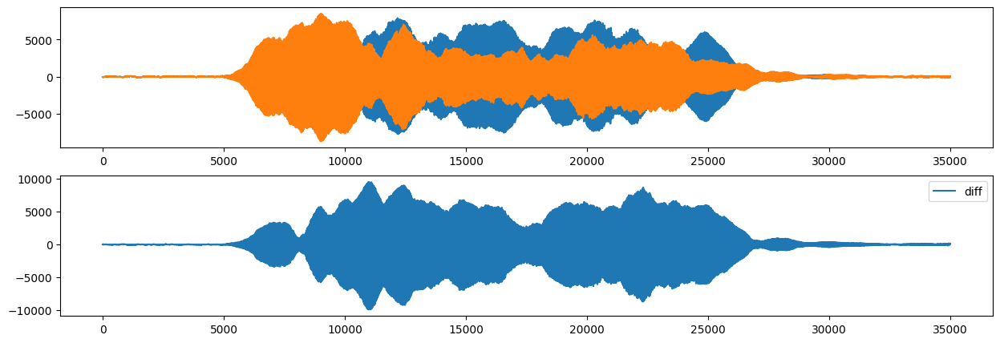

In [11]:
whistle_front = whistle[15000:50000]
display_left_right(whistle_front)


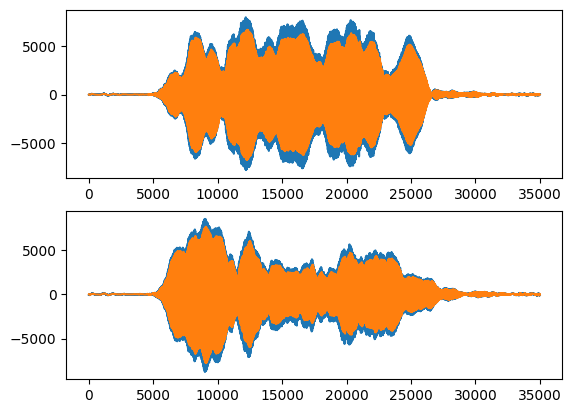

In [12]:
def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

# Filter requirements.  
order = 10 
fs = rate       # sample rate, Hz
cutoff = 1500  # desired cutoff frequency of the filter, Hz

# Get the filter coefficients so we can check its frequency response.
b, a = butter_lowpass(cutoff, fs, order)

# Filter the data, and plot both the original and filtered signals.
yl = butter_lowpass_filter(whistle_front[:,0], cutoff, fs, order).astype(np.int16)
yr = butter_lowpass_filter(whistle_front[:,1], cutoff, fs, order).astype(np.int16)

plt.subplot(2, 1, 1)
plt.plot(whistle_front[:,0])
plt.plot(yl)
plt.subplot(2, 1, 2)
plt.plot(whistle_front[:,1])
plt.plot(yr)
plt.show()


In [13]:
def low_pass_filter_and_correlate(stereo_audio, order=10, rate = 48000, cutoff = 1500):
    b, a = butter_lowpass(cutoff, rate, order)
    yl = butter_lowpass_filter(stereo_audio[:,0], cutoff, rate, order).astype(np.int16)
    yr = butter_lowpass_filter(stereo_audio[:,1], cutoff, rate, order).astype(np.int16)

    # plot the base andio and filtered audio for left and right channels
    plt.subplot(3, 1, 1)
    plt.plot(stereo_audio[:,0])
    plt.plot(yl)
    plt.subplot(3, 1, 2)
    plt.plot(stereo_audio[:,1])
    plt.plot(yr)

    # compute and plot the correlation between the two channels
    res = np.correlate(yl[:], yr[:], mode='same')
    plt.subplot(3, 1, 3)
    plt.plot(res)

    plt.show()

    print(np.argmax(res)) # maximumu correlation
    
    return 

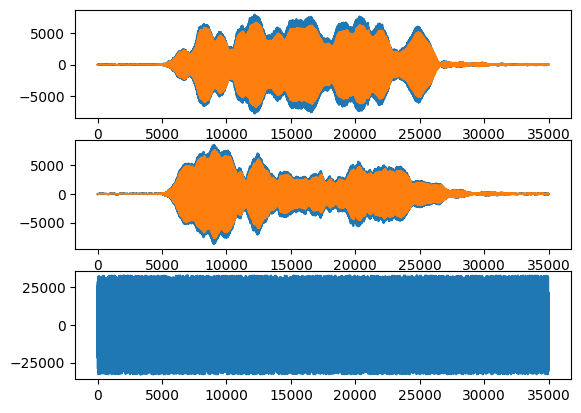

1072


In [14]:
low_pass_filter_and_correlate(whistle_front)

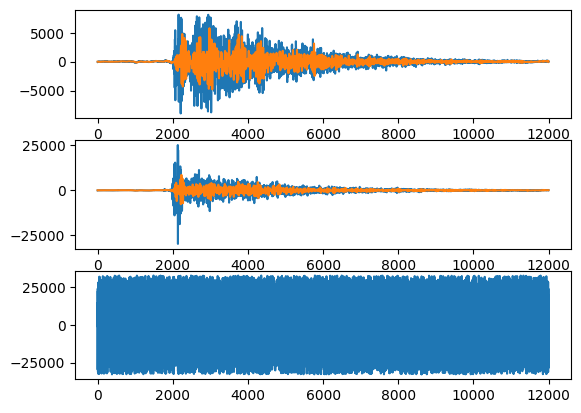

1487


In [15]:
low_pass_filter_and_correlate(lr_clap_right, cutoff=2000)

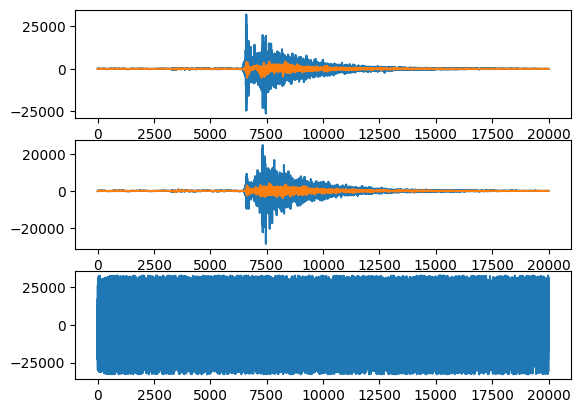

3179


In [16]:
low_pass_filter_and_correlate(lr_clap_left, cutoff=2000)

## Using a 1000hz sinwave

In [17]:
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

In [18]:
def band_pass_filter_and_correlate(stereo_audio, order=10, rate = 48000, lowcut = 1000, highcut = 2000):
    b, a = butter_bandpass(lowcut, highcut, rate, order)
    yl = butter_bandpass_filter(stereo_audio[:,0], lowcut, highcut, rate, order).astype(np.int16)
    yr = butter_bandpass_filter(stereo_audio[:,1], lowcut, highcut, rate, order).astype(np.int16)

    # plot the base andio and filtered audio for left and right channels
    plt.subplot(3, 1, 1)
    plt.plot(stereo_audio[:,0])
    plt.plot(yl)
    plt.subplot(3, 1, 2)
    plt.plot(stereo_audio[:,1])
    plt.plot(yr)

    # compute and plot the correlation between the two channels
    res = np.correlate(yl[:], yr[:], mode='same')
    plt.subplot(3, 1, 3)
    plt.plot(res)

    plt.show()

    print(np.argmax(res)) # maximumu correlation
    
    return 

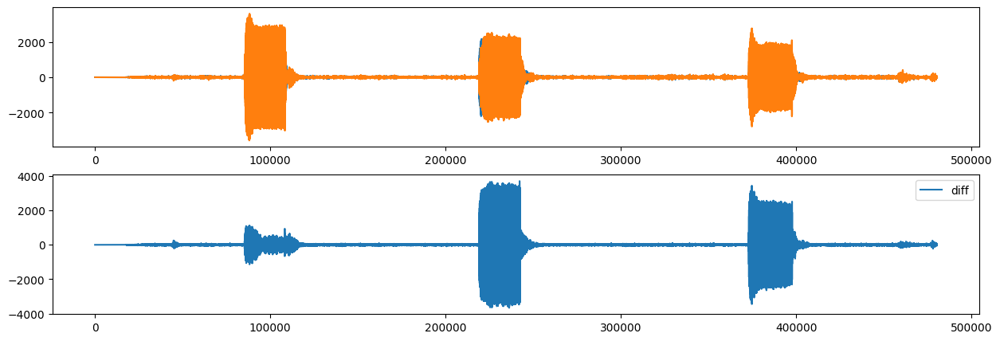

In [19]:
PATH1 = "audio/stereo-1000hz.wav"
rate, data = scipy.io.wavfile.read(PATH1)
display_left_right(data)

In [20]:
IPython.display.Audio(PATH1)

### Front bip

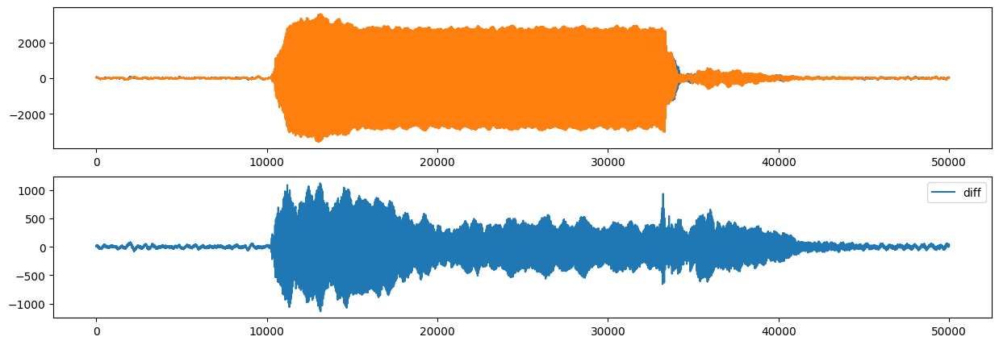

In [21]:
front_bip_start = 75000
front_bip_end = 125000
front_bip = data[front_bip_start:front_bip_end]

display_left_right(front_bip)

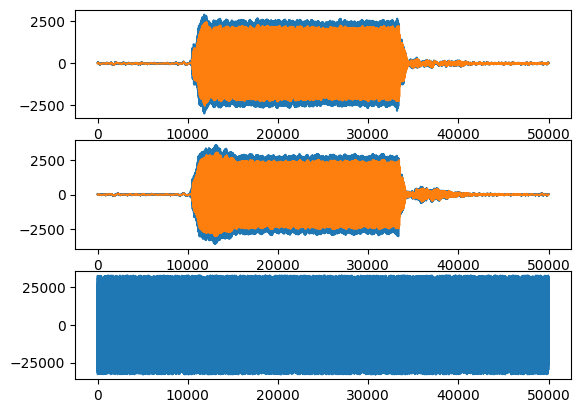

21010


In [22]:
low_pass_filter_and_correlate(front_bip, cutoff=1050) # using only the lowpass filter


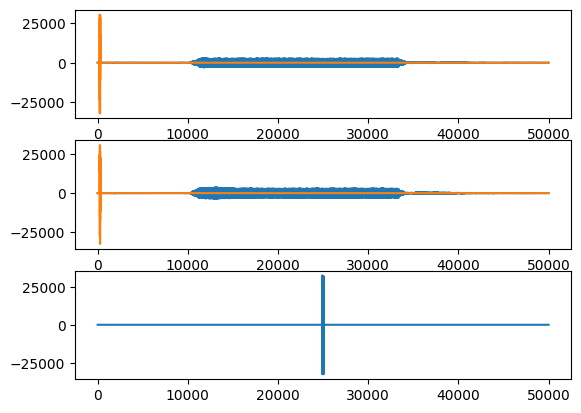

24914


In [23]:
band_pass_filter_and_correlate(front_bip, lowcut=990, highcut=1010) # using only the bandpass filter

### Looking at the energy of the signal

In [24]:
def compute_energy_ratio(data):
    return np.sum(data[:,0]**2)/np.sum(data[:,1]**2)

In [25]:
front_bip_left_energy = np.sum(front_bip[:,0]**2)
front_bip_right_energy = np.sum(front_bip[:,1]**2)

ratio = front_bip_left_energy / front_bip_right_energy

theta = np.arccos(np.sqrt(ratio))

print(ratio, theta)

1.0355796816035954 nan


C:\Users\eliot\AppData\Local\Temp\ipykernel_15584\3784586136.py:6: RuntimeWarning: invalid value encountered in arccos
  theta = np.arccos(np.sqrt(ratio))


### Left bip

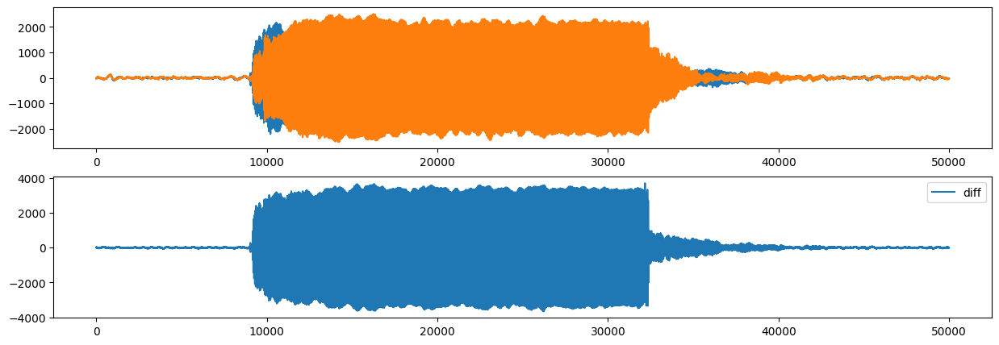

In [26]:
left_bip_start = 210000
left_bip_end = 260000
left_bip = data[left_bip_start:left_bip_end]

display_left_right(left_bip)

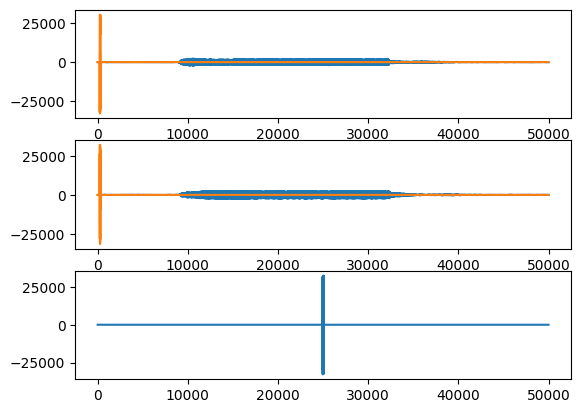

25043


In [27]:
band_pass_filter_and_correlate(left_bip, lowcut=990, highcut=1010) # using only the bandpass filter

In [28]:
print(compute_energy_ratio(left_bip))

0.8376119334870472


### Right bip

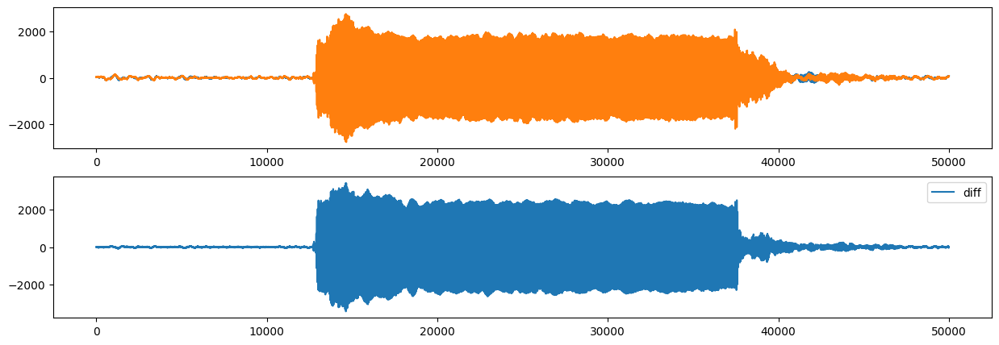

In [29]:
right_bip_start = 360000
right_bip_end = 410000
right_bip = data[right_bip_start:right_bip_end]

display_left_right(right_bip)

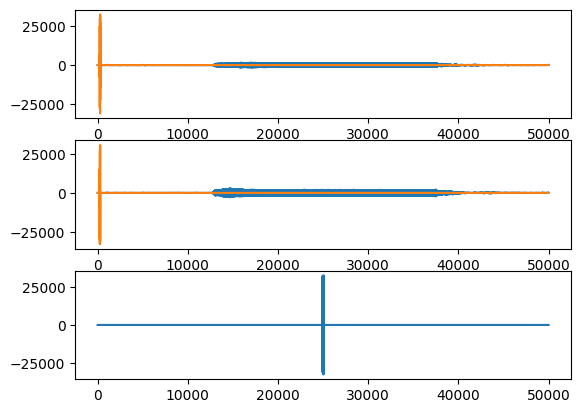

25084


In [30]:
band_pass_filter_and_correlate(right_bip, lowcut=990, highcut=1010) # using only the bandpass filter

In [31]:
print(compute_energy_ratio(right_bip))

0.9594999239806477


## Continuous bip left to right

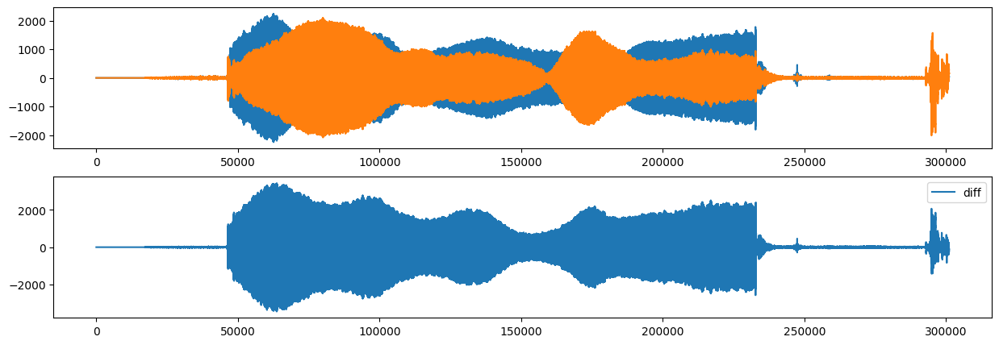

In [32]:
PATH2 = "audio/stereo-1000hz-continuous.wav"
rate, continuous = scipy.io.wavfile.read(PATH2)
display_left_right(continuous)

The minimum in the difference graph is when the sound souce is in front of the stereo mic.

In [33]:
IPython.display.Audio(PATH2)

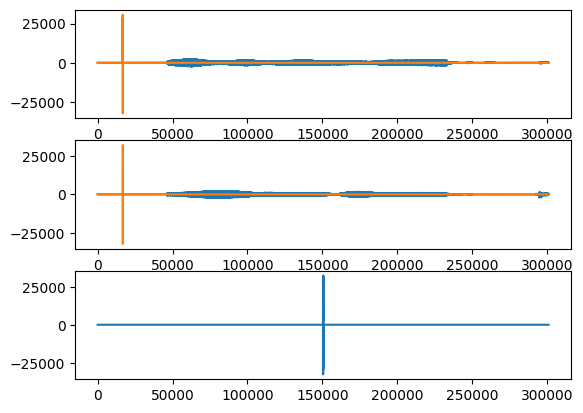

150547


In [34]:
band_pass_filter_and_correlate(continuous, lowcut=990, highcut=1010) # using only the bandpass filter

In [35]:
def compute_correaltion(data):
    return np.correlate(data[:,0], data[:,1])

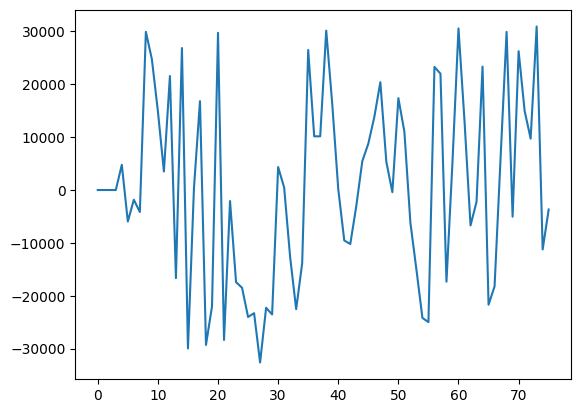

In [39]:
len(continuous)

window_size = 4000

correlation = []

for i in range(0, len(continuous), window_size):
    correlation.append(compute_correaltion(continuous[i:i+window_size]))

plt.plot(correlation)

In [180]:
IPython.display.Audio(PATH2)

## With pyroomacoustics

In [105]:
# Location of sources
azimuth = np.array([61., 270.]) / 180. * np.pi
distance = 2.  # meters

In [106]:
c = 343.    # speed of sound
fs = 16000  # sampling frequency
nfft = 256  # FFT size
freq_range = [300, 3500]

In [131]:
snr_db = 5.    # signal-to-noise ratio
sigma2 = 10**(-snr_db / 10) / (4. * np.pi * distance)**2

# Create an anechoic room
room_dim = np.r_[10.,10.]
aroom = pra.ShoeBox(room_dim, fs=fs, max_order=0, sigma2_awgn=sigma2)

In [132]:
echo = pra.circular_2D_array(center=room_dim/2, M=1, phi0=0, radius=37.5e-3)
echo = np.concatenate((echo, np.array(room_dim/2, ndmin=2).T), axis=1)
aroom.add_microphone_array(pra.MicrophoneArray(echo, aroom.fs))

In [133]:
# Add sources of 1 second duration
rng = np.random.RandomState(23)
duration_samples = int(fs)

for ang in azimuth:
    source_location = room_dim / 2 + distance * np.r_[np.cos(ang), np.sin(ang)]
    source_signal = rng.randn(duration_samples)
    aroom.add_source(source_location, signal=source_signal)
    
# Run the simulation
aroom.simulate()

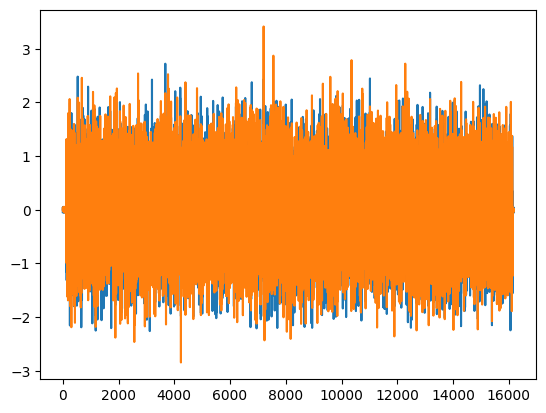

In [134]:
plt.plot(aroom.mic_array.signals.T)

In [110]:
X = pra.transform.stft.analysis(aroom.mic_array.signals.T, nfft, nfft // 2)
X = X.transpose([2, 1, 0])

#doa = pra.doa.algorithms["MUSIC"](echo, fs, nfft, c=c, num_src=2, max_four=4)
#
## this call here perform localization on the frames in X
#doa.locate_sources(X, freq_range=freq_range)

In [171]:
left_bip_norm = left_bip.astype(float)
left_bip_norm[:,0] = left_bip[:,0] / np.max(np.abs(left_bip[:,0]))
left_bip_norm[:,1] = left_bip[:,1] / np.max(np.abs(left_bip[:,1]))

In [172]:
left_bip_norm

array([[-0.00453104, -0.0114897 ],
       [-0.00679656, -0.00752773],
       [-0.00407793, -0.01030111],
       ...,
       [-0.00679656, -0.00475436],
       [-0.00634345, -0.00633914],
       [-0.00860897, -0.00594295]])

In [173]:
nfft = 8192
doa = pra.doa.algorithms['MUSIC'](L = np.array([[0, 0], [1e-1, 0]]), fs=rate, n_src=1, nfft = nfft)
X = pra.transform.stft.analysis(left_bip_norm, nfft, nfft // 2)
X = X.transpose([2, 1, 0])
doa.locate_sources(X, freq_range=[300, 3500])
spatial_resp = doa.grid.values

#normalize
min_val = spatial_resp.min()
max_val = spatial_resp.max()
spatial_resp = (spatial_resp - min_val) / (max_val - min_val)

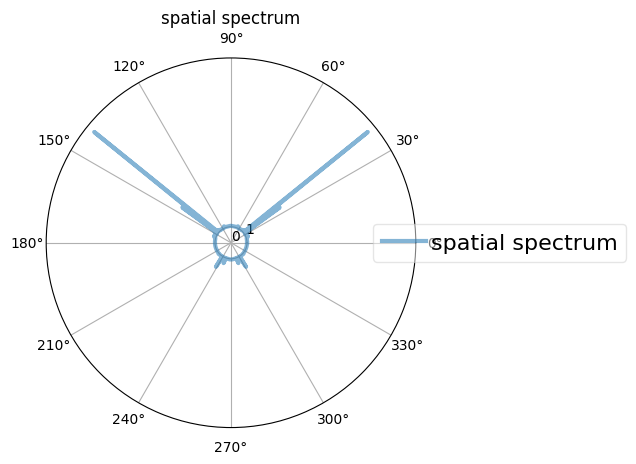

In [175]:
# plotting param
base = 1.
height = 10.
true_col = [0, 0, 0]

# loop through algos
phi_plt = doa.grid.azimuth

# plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='polar')
c_phi_plt = np.r_[phi_plt, phi_plt[0]]
c_dirty_img = np.r_[spatial_resp, spatial_resp[0]]
ax.plot(c_phi_plt, base + height * c_dirty_img, linewidth=3,
        alpha=0.55, linestyle='-',
        label="spatial spectrum")
plt.title("spatial spectrum")


handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, framealpha=0.5,
            scatterpoints=1, loc='center right', fontsize=16,
            ncol=1, bbox_to_anchor=(1.6, 0.5),
            handletextpad=.2, columnspacing=1.7, labelspacing=0.1)

ax.set_xticks(np.linspace(0, 2 * np.pi, num=12, endpoint=False))
ax.xaxis.set_label_coords(0.5, -0.11)
ax.set_yticks(np.linspace(0, 1, 2))

ax.set_ylim([0, 1.05 * (base + height)])

plt.show()



In [ ]:
import torch